# Predict the Domestic Market (Contract) Blow Molding

# Problem Statement:
    
* Main Objective: Predict the Domestic Market (Contract) Blow Molding, Low price.
(3) Build a univariate ARIMA, LSTM, and Lazy Predict with thoughtful features from the list.
If you can add any other models that would be great. For the final model please highlight
time period where the confidence level went down for historic forecasts.


# Importing the required libraries:

In [119]:
import pandas as pd
import numpy as np

#for plotting and EDA
import matplotlib.pyplot as plt
import seaborn as sns

#for model building
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso, Ridge
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

#for spliting dataset into train and test
from sklearn.model_selection import train_test_split

#for model evaluation
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings('ignore')

# Loading the dataset

In [120]:
# Reading Random Dataset Trial Assignment excel files using pandas and saving as data
data= pd.read_excel('Random Price Dataset Trial Assignment.xlsx')

In [121]:
data.head()#here the dataset shows head 

,Date,"Domestic Market (Contract) Blow Molding, Low",Spot/Export Blow Molding,"Spot, Domestic",WTISPLC,MCOILBRENTEU,GASREGM,IMPCH,EXPCH,PRUBBUSDM,...,Russia_import,South_Africa_import,Turkey_import,Brazil_import,France_import,Germeny_import,United Kingdome_import,China_import,Japan_import,South_korea_import
0,2000-01-01,41.0,NaN,NaN,27.18,25.51,1.289,6902.1,863.1,29.207387,...,NaN,NaN,6833222.0,2649293.0,35239920.0,NaN,NaN,NaN,NaN,NaN
1,2000-02-01,41.0,NaN,NaN,29.35,27.78,1.377,6584.4,972.7,33.391099,...,NaN,NaN,5647987.0,2787667.0,36716752.0,NaN,NaN,NaN,NaN,NaN
2,2000-03-01,45.0,NaN,NaN,29.89,27.49,1.516,6424.1,1330.5,30.941913,...,NaN,NaN,6721125.0,4692701.0,45144561.0,NaN,NaN,NaN,NaN,NaN
3,2000-04-01,47.0,NaN,NaN,25.74,22.76,1.465,7070.5,1227.5,31.930148,...,NaN,NaN,7169182.0,2565068.0,32240349.0,NaN,NaN,NaN,NaN,NaN
4,2000-05-01,47.0,NaN,NaN,28.78,27.74,1.487,7850.2,1526.3,31.201702,...,NaN,NaN,10466333.0,4671325.0,29351633.0,NaN,NaN,NaN,NaN,NaN


In [122]:
# printing the number of columns and rows in data as well as the type of data present in the datasets.
print(data.shape)
print(data.dtypes)
print(data.columns)

(276, 50)
Date                                                                                                                          datetime64[ns]
Domestic Market (Contract) Blow Molding, Low                                                                                         float64
Spot/Export Blow Molding                                                                                                             float64
Spot, Domestic                                                                                                                       float64
WTISPLC                                                                                                                              float64
MCOILBRENTEU                                                                                                                         float64
GASREGM                                                                                                                              float64
IMP

* here we checked the data shapes 
* noties the onbjects and intiger in the given values 

In [123]:
data.info()#here the data info checked 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276 entries, 0 to 275
Data columns (total 50 columns):
 #   Column                                                                                                                      Non-Null Count  Dtype         
---  ------                                                                                                                      --------------  -----         
 0   Date                                                                                                                        276 non-null    datetime64[ns]
 1   Domestic Market (Contract) Blow Molding, Low                                                                                276 non-null    float64       
 2   Spot/Export Blow Molding                                                                                                    185 non-null    float64       
 3   Spot, Domestic                                                                            

In [124]:
data.describe()# the total data describe

,"Domestic Market (Contract) Blow Molding, Low",Spot/Export Blow Molding,"Spot, Domestic",WTISPLC,MCOILBRENTEU,GASREGM,IMPCH,EXPCH,PRUBBUSDM,WPUFD4111,...,Russia_import,South_Africa_import,Turkey_import,Brazil_import,France_import,Germeny_import,United Kingdome_import,China_import,Japan_import,South_korea_import
count,276.000000,185.000000,125.000000,276.000000,276.000000,276.000000,275.000000,275.000000,275.000000,275.000000,...,1.080000e+02,1.540000e+02,1.680000e+02,1.680000e+02,2.400000e+02,1.780000e+02,1.540000e+02,1.080000e+02,1.530000e+02,0.0
mean,72.371377,57.979730,60.396000,62.505688,65.403768,2.570399,29591.894215,7176.495470,89.579463,185.978265,...,3.178024e+07,1.201470e+07,4.689177e+07,1.877743e+07,5.951620e+07,1.213508e+08,6.680952e+07,5.684049e+08,1.751055e+07,NaN
std,19.415335,13.116195,12.647484,26.065922,29.612183,0.780782,12303.526704,3764.254058,46.390987,31.712684,...,1.237663e+07,4.129202e+06,3.325299e+07,1.343147e+07,2.303410e+07,2.341668e+07,1.284275e+07,1.436171e+08,5.951273e+06,NaN
min,32.000000,28.000000,33.250000,16.550000,18.380000,1.086000,6375.600000,863.100000,22.119907,135.000000,...,1.222930e+07,4.023189e+06,5.210434e+06,2.565068e+06,1.864643e+06,6.521024e+07,3.946846e+07,2.790990e+08,2.288267e+06,NaN
25%,57.750000,49.000000,53.000000,41.000000,42.727500,1.982000,20508.605662,3644.347996,60.831129,155.650000,...,2.197529e+07,9.039823e+06,1.301532e+07,7.166384e+06,4.257762e+07,1.052432e+08,5.695974e+07,4.541179e+08,1.415546e+07,NaN
50%,73.000000,59.000000,59.000000,59.280000,62.770000,2.555000,31563.988155,8080.515063,78.408574,193.400000,...,2.905798e+07,1.148613e+07,4.411321e+07,1.302269e+07,6.296210e+07,1.211287e+08,6.562112e+07,5.796089e+08,1.701399e+07,NaN
75%,86.000000,67.000000,67.500000,84.170000,85.587500,3.149000,39575.405922,9741.468033,107.593858,208.600000,...,3.983874e+07,1.473999e+07,7.409663e+07,3.050157e+07,7.249226e+07,1.364749e+08,7.409497e+07,6.691375e+08,2.170501e+07,NaN
max,108.000000,92.000000,100.750000,133.930000,132.720000,4.929000,52081.070497,16678.510021,280.787619,278.025000,...,7.870940e+07,2.417119e+07,1.234086e+08,5.262447e+07,1.194858e+08,1.866896e+08,1.094211e+08,8.865592e+08,2.943658e+07,NaN


In [125]:
print(data.nunique())# here checked the unique values 

Date                                                                                                                          276
Domestic Market (Contract) Blow Molding, Low                                                                                   69
Spot/Export Blow Molding                                                                                                       88
Spot, Domestic                                                                                                                 74
WTISPLC                                                                                                                       272
MCOILBRENTEU                                                                                                                  274
GASREGM                                                                                                                       258
IMPCH                                                                                     

In [126]:
data.isnull().sum()# here checked the null values 

Date                                                                                                                            0
Domestic Market (Contract) Blow Molding, Low                                                                                    0
Spot/Export Blow Molding                                                                                                       91
Spot, Domestic                                                                                                                151
WTISPLC                                                                                                                         0
MCOILBRENTEU                                                                                                                    0
GASREGM                                                                                                                         0
IMPCH                                                                                     

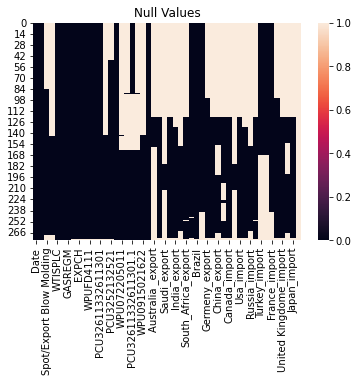

In [10]:
#heatmap for null values
sns.heatmap(data.isnull())
plt.title("Null Values")
plt.show()


* Here we found here lot of Null values so we filled NAN value with mean and mode by analysing 

In [127]:
data.skew()# here checked the skew value 

Domestic Market (Contract) Blow Molding, Low                                                                                 -0.191743
Spot/Export Blow Molding                                                                                                     -0.012785
Spot, Domestic                                                                                                                0.804064
WTISPLC                                                                                                                       0.330892
MCOILBRENTEU                                                                                                                  0.342328
GASREGM                                                                                                                       0.201322
IMPCH                                                                                                                        -0.341986
EXPCH                                                  

* Then we checked the skew value found lot of Skew values same understand the by outlier 

# EDA(exploratory data analysis)

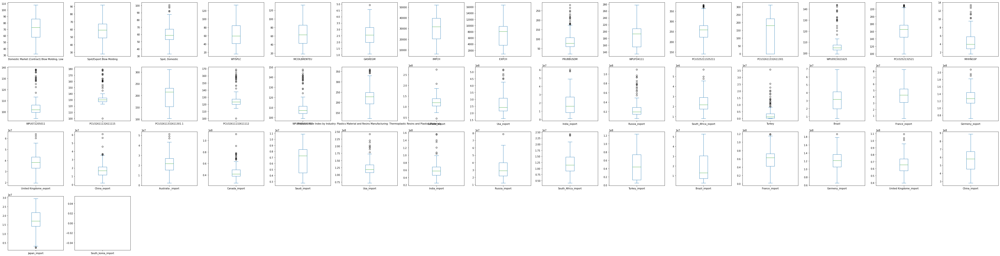

In [12]:
#Plotting bosplot to check the outliers in the datset
data.plot(kind='box',subplots= True,layout=(30,15),figsize=(75,150))
plt.show()

In [128]:
nu=data.select_dtypes(include=[np.number])
ca=data.select_dtypes(exclude=[np.number])
ca['Australia _export'].fillna(ca['Australia _export'].mode()[0],inplace=True)
ca['Saudi_export'].fillna(ca['Saudi_export'].mode()[0],inplace=True)

In [129]:
ca.drop(['Date'],axis=1,inplace=True)
ca=ca.select_dtypes(exclude=[np.number])#converted into all numbers 

In [130]:
nu=nu.fillna(nu.mean())# here we filled the value by mean 
nu.drop(['South_korea_import'],axis=1,inplace=True)

In [131]:
ca["Australia _export"] = [float(str(i).replace(",", "")) for i in ca["Australia _export"]]
ca["Saudi_export"] = [float(str(i).replace(",", "")) for i in ca["Saudi_export"]]

In [132]:
data1 = pd.concat([nu,ca], axis=1, join='inner')
display(data1)

,"Domestic Market (Contract) Blow Molding, Low",Spot/Export Blow Molding,"Spot, Domestic",WTISPLC,MCOILBRENTEU,GASREGM,IMPCH,EXPCH,PRUBBUSDM,WPUFD4111,...,South_Africa_import,Turkey_import,Brazil_import,France_import,Germeny_import,United Kingdome_import,China_import,Japan_import,Australia _export,Saudi_export
0,41.0,57.97973,60.396,27.18,25.51,1.289,6902.100000,863.100000,29.207387,135.000000,...,1.201470e+07,6.833222e+06,2.649293e+06,3.523992e+07,1.213508e+08,6.680952e+07,5.684049e+08,1.751055e+07,488137.0,300031308.0
1,41.0,57.97973,60.396,29.35,27.78,1.377,6584.400000,972.700000,33.391099,136.000000,...,1.201470e+07,5.647987e+06,2.787667e+06,3.671675e+07,1.213508e+08,6.680952e+07,5.684049e+08,1.751055e+07,488137.0,300031308.0
2,45.0,57.97973,60.396,29.89,27.49,1.516,6424.100000,1330.500000,30.941913,136.000000,...,1.201470e+07,6.721125e+06,4.692701e+06,4.514456e+07,1.213508e+08,6.680952e+07,5.684049e+08,1.751055e+07,488137.0,300031308.0
3,47.0,57.97973,60.396,25.74,22.76,1.465,7070.500000,1227.500000,31.930148,137.300000,...,1.201470e+07,7.169182e+06,2.565068e+06,3.224035e+07,1.213508e+08,6.680952e+07,5.684049e+08,1.751055e+07,488137.0,300031308.0
4,47.0,57.97973,60.396,28.78,27.74,1.487,7850.200000,1526.300000,31.201702,138.200000,...,1.201470e+07,1.046633e+07,4.671325e+06,2.935163e+07,1.213508e+08,6.680952e+07,5.684049e+08,1.751055e+07,488137.0,300031308.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271,93.0,57.97973,60.396,93.67,100.45,3.975,50348.836582,12906.699996,73.304558,262.981000,...,1.931011e+07,4.689177e+07,1.877743e+07,5.951620e+07,1.441313e+08,8.187255e+07,5.684049e+08,2.609701e+07,488137.0,300031308.0
272,90.0,57.97973,60.396,84.26,89.76,3.700,49247.891499,11953.510580,66.956499,265.656000,...,1.441044e+07,4.689177e+07,1.877743e+07,5.951620e+07,1.133109e+08,7.447744e+07,5.684049e+08,2.127734e+07,488137.0,300031308.0
273,90.0,57.97973,60.396,87.55,93.33,3.815,44571.967124,15698.339652,68.535729,268.312000,...,1.678302e+07,4.689177e+07,1.877743e+07,5.951620e+07,1.193070e+08,1.094211e+08,5.684049e+08,1.751055e+07,488137.0,300031308.0
274,90.0,57.97973,60.396,84.37,91.42,3.685,36876.437049,15576.005996,65.265834,278.025000,...,1.107904e+07,4.689177e+07,1.877743e+07,5.951620e+07,1.213508e+08,6.680952e+07,5.684049e+08,1.751055e+07,488137.0,300031308.0


# Uni-variate Analysis¶

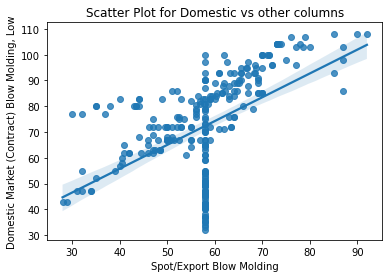

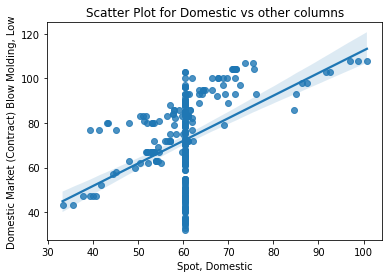

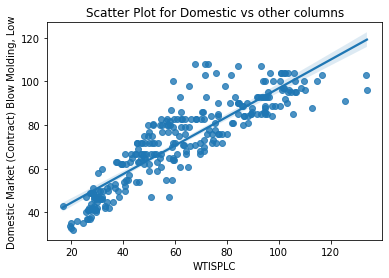

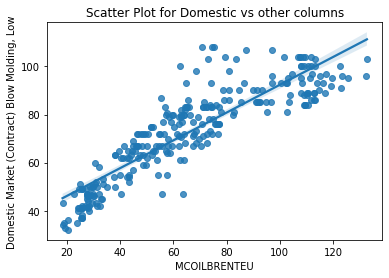

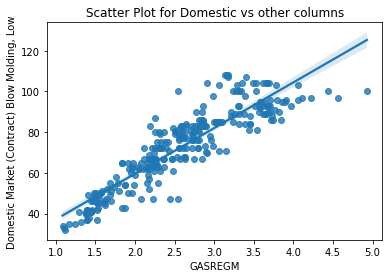

...

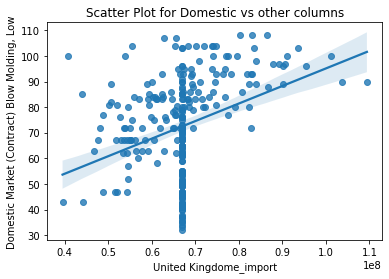

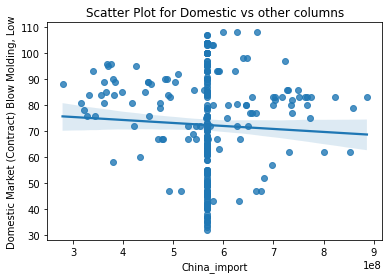

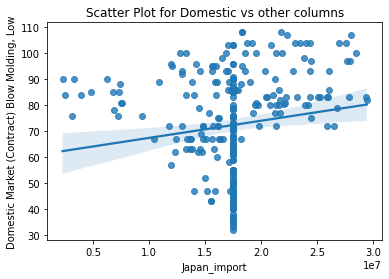

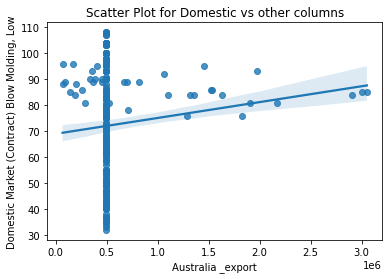

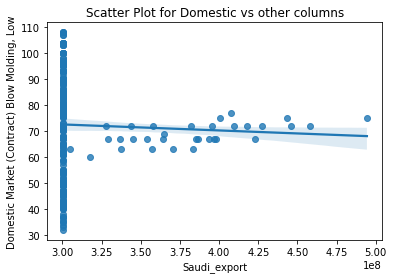

In [75]:
#Checking how W is variated with all columns separately
for i in data1.columns[1:]:                                        
    plt.figure(figsize = (6, 4))
    sns.regplot(data1[i], data1['Domestic Market (Contract) Blow Molding, Low'])
    plt.title('Scatter Plot for Domestic vs other columns')
    plt.xlabel(i)
    plt.ylabel('Domestic Market (Contract) Blow Molding, Low')
    plt.show()

#here above shows univariate analysis 
* The each Domestic Molding blow compare with another data like import and export datas found some the data are ok

# Mult Variate Analysis

In [76]:
#Checking normal distribution of each column
sns.pairplot(data1) 
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

# Multicollinearity 

<AxesSubplot:>

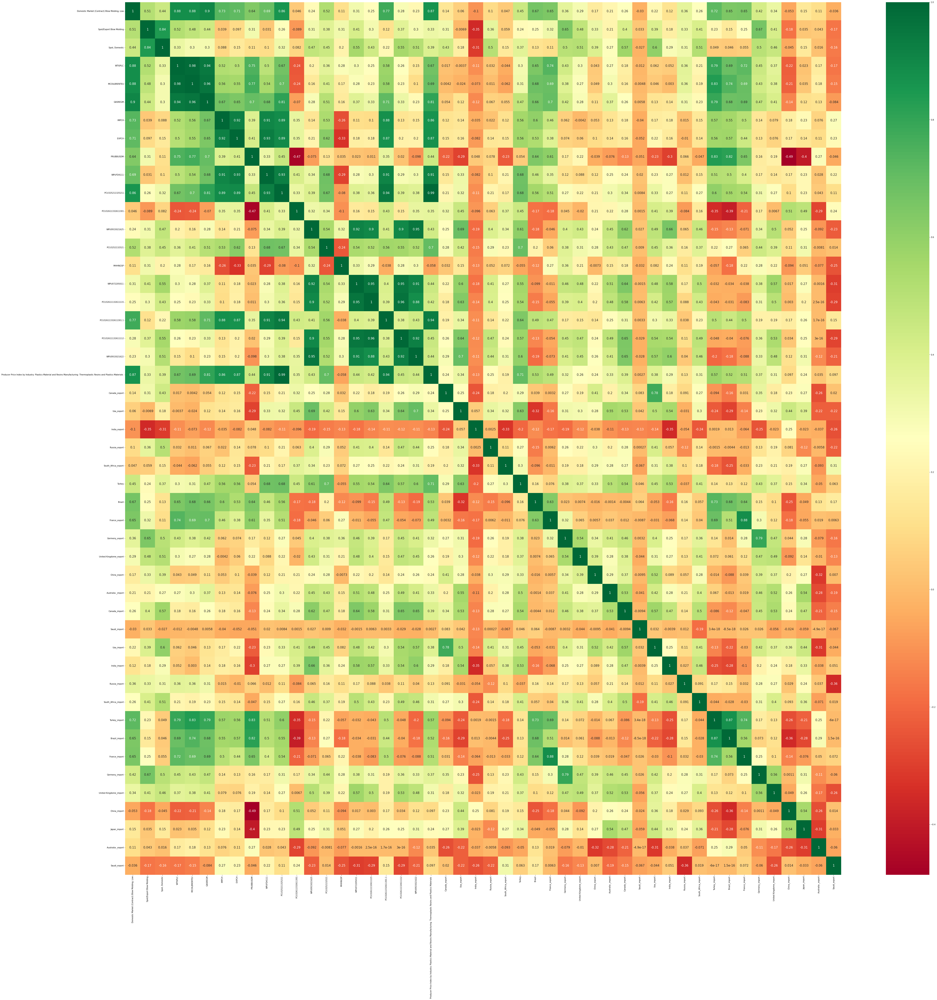

In [18]:
#Heatmap for correlation
plt.figure(figsize=(80, 80))
sns.heatmap(data1.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":15})

* The above shows lot of multicollinearity found this datasets
* we observed and removed the multicollinearity 

In [133]:
#by using the z score technique recudes the multicollinearity
# z score technique 
from scipy.stats import zscore
z=np.abs(zscore(data1))

In [134]:
data2=data1[(z<3).all(axis=1)]
print(data1.shape)
print(data2.shape)

(276, 48)
(183, 48)


In [135]:
#here we reduces the error by 33.69 the below shows the calucalation 
loss_percent=((276-183)/276)*100
loss_percent

33.69565217391305

In [136]:
# specify input and output attributes
x= data2.drop('Domestic Market (Contract) Blow Molding, Low',axis=1)
y = data2['Domestic Market (Contract) Blow Molding, Low']

In [137]:
#removing skewness
from sklearn.preprocessing import power_transform 
#using yeo-johnson method due to presence of negative skewness
x_new = power_transform(x, method='yeo-johnson')        
x_new = pd.DataFrame(x_new, columns = x.columns)

In [138]:
#SKewness removed
x_new.skew()

Spot/Export Blow Molding                                                                                                      0.032036
Spot, Domestic                                                                                                                0.243454
WTISPLC                                                                                                                      -0.028478
MCOILBRENTEU                                                                                                                 -0.015437
GASREGM                                                                                                                      -0.000307
IMPCH                                                                                                                        -0.169814
EXPCH                                                                                                                        -0.113268
PRUBBUSDM                                              

In [139]:
#To Normalize the data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = scaler.fit_transform(x_new)

In [140]:
#checking shape of x and y
print(x.shape)
print(y.shape)

(183, 47)
(183,)


# Data Preprocessing

In [141]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.model_selection import cross_val_score,KFold,ShuffleSplit

# Logistic Regression

In [142]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=i)
    lr=LinearRegression()
    lr.fit(x_train, y_train)
    y_lr = lr.predict(x_test)
    lr_r2 = r2_score(y_test, y_lr)
    
    if lr_r2>maxAccuracy:
        maxAccuracy=lr_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.9596437295607475  on Random State 83


In [143]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=83)

#training our model
lr=LinearRegression()
lr.fit(x_train, y_train)

#Predicting y_test
y_lr = lr.predict(x_test)
lr_r2 = r2_score(y_test, y_lr)

#R2 Score
print("R2 score : ", lr_r2)

#Cross Validation Score
cross_val_lr = cross_val_score(lr,x,y,cv=5)
print(cross_val_lr)
print("Cross Validation Score : ",cross_val_lr.mean())

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_lr))
print("Mean Square Error : ",mean_squared_error(y_test,y_lr))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_lr)))

R2 score :  0.9596437295607475
[ 0.36732363  0.63742978  0.76344567 -0.68535734 -3.03423312]
Cross Validation Score :  -0.39027827302560175
Mean Absolute Error : 2.926022985349948
Mean Square Error :  15.414441034229338
Root Mean Square Error : 3.926122901060197


In [144]:
#K-fold cross validation
K_fold = KFold(5)
print(K_fold)
l1 = cross_val_score(lr,x,y,cv=K_fold)
print(l1)
print("K-Fold Cross Validation Score : " , l1.mean())

print('-'*80)

#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
l2 = cross_val_score(lr,x,y,cv=shuffle)
print(l2)
print("Shuffle Split : ",l2.mean())

KFold(n_splits=5, random_state=None, shuffle=False)
[ 0.36732363  0.63742978  0.76344567 -0.68535734 -3.03423312]
K-Fold Cross Validation Score :  -0.39027827302560175
--------------------------------------------------------------------------------
ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.85212869 0.90945713 0.89418224 0.95919322 0.93703187]
Shuffle Split :  0.9103986327767511


# Decision Tree
Finding best random state for the model

In [145]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=i)
    dt=DecisionTreeRegressor()
    dt.fit(x_train, y_train)
    y_dt = dt.predict(x_test)
    dt_r2 = r2_score(y_test, y_dt)
    
    if dt_r2>maxAccuracy:
        maxAccuracy=dt_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.9760755349949448  on Random State 12


In [146]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=2)

#training our model
dt=DecisionTreeRegressor()
dt.fit(x_train, y_train)

#Predicting y_test
y_dt = dt.predict(x_test)
dt_r2 = r2_score(y_test, y_dt)

#R2 Score
print("R2 score : ", dt_r2)

#Cross Validation Score
cross_val_dt = cross_val_score(dt,x,y,cv=5)
print(cross_val_dt)
print("Cross Validation Score : ",cross_val_dt.mean())

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_dt))
print("Mean Square Error : ",mean_squared_error(y_test,y_dt))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_dt)))

R2 score :  0.9270315474426236
[-0.641902    0.57664456  0.04034056 -0.16568395 -0.39591036]
Cross Validation Score :  -0.11730223869066388
Mean Absolute Error : 3.8636363636363638
Mean Square Error :  31.577272727272728
Root Mean Square Error : 5.619365865226496


In [147]:
#K Fold Cross Validation
K_fold = KFold(5)
print(K_fold)
l11 = cross_val_score(dt,x,y,cv=K_fold)
print(l11)
print("K-Fold Cross Validation Score : " , l11.mean())

print('-'*75)

#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
l21 = cross_val_score(dt,x,y,cv=shuffle)
print(l21)
print("Shuffle Split : ",l21.mean())

KFold(n_splits=5, random_state=None, shuffle=False)
[-0.69860077  0.46275947  0.25043733 -1.16384837 -0.20362733]
K-Fold Cross Validation Score :  -0.2705759346304509
---------------------------------------------------------------------------
ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.85562613 0.91475903 0.86257386 0.82657841 0.90439215]
Shuffle Split :  0.8727859141202339


# KNN
Finding best random state for the model

In [148]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=i)
    knn=KNeighborsRegressor()
    knn.fit(x_train, y_train)
    y_knn = knn.predict(x_test)
    knn_r2 = r2_score(y_test, y_knn)
    
    if knn_r2>maxAccuracy:
        maxAccuracy=knn_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.9633640863526989  on Random State 38


In [149]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=38)

#training our model
knn=KNeighborsRegressor()
knn.fit(x_train, y_train)

#Predicting y_test
y_knn = knn.predict(x_test)
knn_r2 = r2_score(y_test, y_knn)

#R2 Score
print("R2 score : ", knn_r2)

#Cross Validation Score
cross_val_knn = cross_val_score(knn,x,y,cv=5)
print(cross_val_knn)
print("Cross Validation Score : ",cross_val_knn.mean())

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_knn))
print("Mean Square Error : ",mean_squared_error(y_test,y_knn))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_knn)))

R2 score :  0.9633640863526989
[-2.44908093  0.23490402  0.27455279 -0.37715195  0.10826103]
Cross Validation Score :  -0.4417030083069512
Mean Absolute Error : 2.7927272727272725
Mean Square Error :  13.884000000000002
Root Mean Square Error : 3.726123991495721


In [150]:
#K-Fold
K_fold = KFold(5)
print(K_fold)
k = cross_val_score(knn,x,y,cv=K_fold)
print(k)
print("K-Fold Cross Validation Score : " , k.mean())

print('-'*75)

#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
k1 = cross_val_score(knn,x,y,cv=shuffle)
print(k1)
print("Shuffle Split : ",k1.mean())

KFold(n_splits=5, random_state=None, shuffle=False)
[-2.44908093  0.23490402  0.27455279 -0.37715195  0.10826103]
K-Fold Cross Validation Score :  -0.4417030083069512
---------------------------------------------------------------------------
ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.90230342 0.89458037 0.95121932 0.84747641 0.91097719]
Shuffle Split :  0.9013113426858157


# Random Forest
Finding best random state for the model

In [151]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=i)
    rf=RandomForestRegressor()
    rf.fit(x_train, y_train)
    y_rf = rf.predict(x_test)
    rf_r2 = r2_score(y_test, y_rf)
    
    if rf_r2>maxAccuracy:
        maxAccuracy=rf_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.9815622129817856  on Random State 73


In [152]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=73)

#training our model
rf=RandomForestRegressor()
rf.fit(x_train, y_train)

#Predicting y_test
y_rf = rf.predict(x_test)
rf_r2 = r2_score(y_test, y_rf)

#R2 Score
print("R2 score : ", rf_r2)

#Cross Validation Score
cross_val_rf = cross_val_score(rf,x,y,cv=5)
print(cross_val_rf)
print("Cross Validation Score : ",cross_val_rf.mean())

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_rf))
print("Mean Square Error : ",mean_squared_error(y_test,y_rf))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_rf)))

R2 score :  0.9802698995534959
[-2.24933236  0.62165293  0.85254549  0.22203118  0.38170512]
Cross Validation Score :  -0.034279527500937254
Mean Absolute Error : 2.0990000000000006
Mean Square Error :  7.227103181818185
Root Mean Square Error : 2.6883272088453416


In [153]:
#K-Fold
K_fold = KFold(5)
print(K_fold)
r = cross_val_score(rf,x,y,cv=K_fold)
print(r)
print("K-Fold Cross Validation Score : " , r.mean())

print('-'*75)

#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
r1 = cross_val_score(rf,x,y,cv=shuffle)
print(r1)
print("Shuffle Split : ",r1.mean())

KFold(n_splits=5, random_state=None, shuffle=False)
[-2.07574785  0.58670834  0.83914507  0.00863537  0.35323363]
K-Fold Cross Validation Score :  -0.057605087376577636
---------------------------------------------------------------------------
ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.90760946 0.94405584 0.96911163 0.90829322 0.89877756]
Shuffle Split :  0.9255695427307732


# Ada Boost1

In [154]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=i)
    ad=AdaBoostRegressor()
    ad.fit(x_train, y_train)
    y_ad = ad.predict(x_test)
    ad_r2 = r2_score(y_test, y_ad)
    
    if ad_r2>maxAccuracy:
        maxAccuracy=ad_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.9750779638843077  on Random State 73


In [155]:

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=28)

#training our model
ad=AdaBoostRegressor()
ad.fit(x_train, y_train)

#Predicting y_test
y_ad = ad.predict(x_test)
ad_r2 = r2_score(y_test, y_ad)

#R2 Score
print("R2 score : ", ad_r2)

#Cross Validation Score
cross_score_ad = cross_val_score(ad,x,y,cv=5)
print(cross_score_ad)
print("Cross Validation Score : ",cross_score_ad.mean())

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_ad))
print("Mean Square Error : ",mean_squared_error(y_test,y_ad))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_ad)))

R2 score :  0.9338790251375552
[-3.09348446  0.57731863  0.8475217  -0.33822325  0.36421583]
Cross Validation Score :  -0.3285303104173178
Mean Absolute Error : 3.557844076175494
Mean Square Error :  22.101050603183097
Root Mean Square Error : 4.701175449096013


In [156]:
#K Fold
K_fold = KFold(5)
print(K_fold)
a = cross_val_score(ad,x,y,cv=K_fold)
print(a)
print("K-Fold Cross Validation Score : " , a.mean())

print('-'*75)

#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
a1 = cross_val_score(ad,x,y,cv=shuffle)
print(a1)
print("Shuffle Split : ",a1.mean())

KFold(n_splits=5, random_state=None, shuffle=False)
[-2.77024384  0.61223238  0.80936623 -0.55266294  0.4106533 ]
K-Fold Cross Validation Score :  -0.29813097198322025
---------------------------------------------------------------------------
ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.94447979 0.96275565 0.93400889 0.90107547 0.93956172]
Shuffle Split :  0.9363763033005756


# Gradient Boost
Finding best random state for the model

In [157]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=i)
    gb=GradientBoostingRegressor()
    gb.fit(x_train, y_train)
    y_gb = gb.predict(x_test)
    gb_r2 = r2_score(y_test, y_gb)
    
    if gb_r2>maxAccuracy:
        maxAccuracy=gb_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.9847130098898071  on Random State 32


In [158]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=52)

#training our model
gb=GradientBoostingRegressor()
gb.fit(x_train, y_train)

#Predicting y_test
y_gb = gb.predict(x_test)
gb_r2 = r2_score(y_test, y_gb)

#R2 Score
print("R2 score : ", gb_r2)

#Cross Validation Score
cross_score_gb = cross_val_score(gb,x,y,cv=5)
print(cross_score_gb)
print("Cross Validation Score : ",cross_score_gb.mean())

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_gb))
print("Mean Square Error : ",mean_squared_error(y_test,y_gb))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_gb)))

R2 score :  0.9093931647202267
[-2.0680084   0.63422134  0.75317797  0.24262401  0.42293725]
Cross Validation Score :  -0.0030095667355156453
Mean Absolute Error : 3.2829116771376374
Mean Square Error :  32.708738056597134
Root Mean Square Error : 5.719155362166439


In [159]:
#K Fold
K_fold = KFold(5)
print(K_fold)
g = cross_val_score(gb,x,y,cv=K_fold)
print(g)
print("K-Fold Cross Validation Score : " , g.mean())

print('-'*75)

#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
g1 = cross_val_score(gb,x,y,cv=shuffle)
print(g1)
print("Shuffle Split : ",g1.mean())## Conclusion : -
a =np.array(y_test)
predicted = np.array(gb.predict(x_test))
df_concluded =  pd.DataFrame({ 'Original' : a,
                     'predicted' :predicted ,
                   },index = range(len(a))) 



KFold(n_splits=5, random_state=None, shuffle=False)
[-2.08448292  0.62829012  0.75523887  0.17954969  0.39746254]
K-Fold Cross Validation Score :  -0.02478833990121221
---------------------------------------------------------------------------
ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.88940841 0.96908444 0.91163046 0.96302944 0.94118226]
Shuffle Split :  0.934867003044556


# XGBoost

In [160]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=i)
    xgbt=xgb.XGBRegressor()
    xgbt.fit(x_train, y_train)
    y_xgbt = xgbt.predict(x_test)
    xgbt_r2 = r2_score(y_test, y_xgbt)
    
    if xgbt_r2>maxAccuracy:
        maxAccuracy=xgbt_r2
        maxRandomState=i

In [49]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=18)

#training our model
xgbt=xgb.XGBRegressor()
xgbt.fit(x_train, y_train)

#Predicting y_test
y_xgbt = xgbt.predict(x_test)
xgbt_r2 = r2_score(y_test, y_xgbt)

#R2 Score
print("R2 score : ", xgbt_r2)

#Cross Validation Score
cross_score_xgbt = cross_val_score(xgbt,x,y,cv=5)
print(cross_score_xgbt)
print("Cross Validation Score : ",cross_score_xgbt.mean())

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_xgbt))
print("Mean Square Error : ",mean_squared_error(y_test,y_xgbt))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_xgbt)))

R2 score :  0.9213504065948014
[-0.92626457  0.72091752  0.86450115 -0.43416976  0.47902989]
Cross Validation Score :  0.14080284771686713
Mean Absolute Error : 3.3694951144131746
Mean Square Error :  33.3271867084436
Root Mean Square Error : 5.772970354024313


In [161]:
#K-Fold
K_fold = KFold(5)
print(K_fold)
xg = cross_val_score(xgbt,x,y,cv=K_fold)
print(xg)
print("K-Fold Cross Validation Score : " , xg.mean())

print('-'*75)

#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
xg1 = cross_val_score(xgbt,x,y,cv=shuffle)
print(xg1)
print("Shuffle Split : ",xg1.mean())

KFold(n_splits=5, random_state=None, shuffle=False)
[-0.92626457  0.72091752  0.86450115 -0.43416976  0.47902989]
K-Fold Cross Validation Score :  0.14080284771686713
---------------------------------------------------------------------------
ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.96211339 0.90161017 0.98384273 0.91715978 0.88658909]
Shuffle Split :  0.9302630328235167


# Regularization

In [162]:
lasso=Lasso()
parameters={"alpha":np.arange(0.0001,0.1,0.001),'normalize':[True,False],'max_iter':[1000,1500,2000]}
grid=GridSearchCV(lasso,parameters)
grid.fit(x_train,y_train)
grid.best_params_

{'alpha': 0.042100000000000005, 'max_iter': 1000, 'normalize': True}

In [163]:
## Providing Best Parameters
lasso=Lasso(alpha= 0.0191, max_iter= 1000, normalize=True)
lasso.fit(x_train,y_train)
pred=lasso.predict(x_test)
r2_score(y_test,pred)*100

93.6594449317167

In [164]:
n_samples = x.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=30)
cvs = cross_val_score(lasso, x, y, cv=cv)
print("Cross Validation of Lasso Regression model ",cvs.mean())

Cross Validation of Lasso Regression model  0.9517402160303217


# HyperParamter Tuning

In [165]:
from sklearn.model_selection import GridSearchCV

In [166]:
#rf = RandomForestRegressor()
parameters={'n_estimators' : [100,300],'criterion':['mse','mae']}
gridsearch=GridSearchCV(rf,parameters)
gridsearch.fit(x_train,y_train)
gridsearch.best_params_

{'criterion': 'mae', 'n_estimators': 300}

In [167]:
## providing best parameters:-
rf = RandomForestRegressor(criterion='mse',n_estimators=100)
rf.fit(x_train,y_train)
pred = rf.predict(x_test)
score = r2_score(y_test,pred)
score

0.9020519381179751

In [168]:
## Conclusion : -
a =np.array(y_test)
predicted = np.array(rf.predict(x_test))
df_concluded =  pd.DataFrame({ 'Original' : a,
                     'predicted' :predicted ,
                   },index = range(len(a))) 
df_concluded


,Original,predicted
0,61.0,68.430
1,80.0,70.390
2,55.0,67.950
3,80.0,78.520
4,61.0,66.180
5,89.0,88.470
6,104.0,103.280
7,100.0,77.620
8,43.0,46.185
9,49.0,48.100


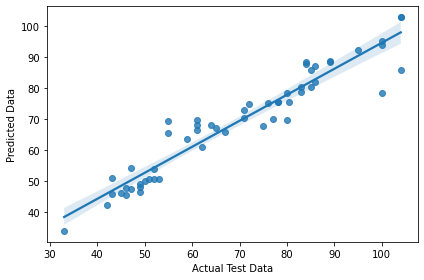

In [169]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
predrfr = rf.predict(x_test)
sns.regplot(y_test,predrfr)
plt.xlabel("Actual Test Data")
plt.ylabel("Predicted Data")
plt.tight_layout()

# model accuray 

In [170]:
R={'Model type':['Logistic Regression','DecisionTreeRegressor','KNN','Random Forest','AdaBoostRegressor','GradientBoostingRegressor','XGBoost'],
   'Mean Absolute Error':[2.9260,2.8727,2.7927,1.9543,3.6216,3.2945,3.3694],
   'Mean Squre Error':[15.4144,17.9279,13.8840,6.6654,22.8924,33.2668,33.3271],
   'Root Mean Absolute Error':[3.9261,4.234,3.72612,2.582,4.7846,5.7677,5.7729],
   'Accuracy':[95,95,96,98,93,90,92]}

Final_Result= pd.DataFrame.from_dict(R)
Final_Result


,Model type,Mean Absolute Error,Mean Squre Error,Root Mean Absolute Error,Accuracy
0,Logistic Regression,2.9260,15.4144,3.92610,95
1,DecisionTreeRegressor,2.8727,17.9279,4.23400,95
2,KNN,2.7927,13.8840,3.72612,96
3,Random Forest,1.9543,6.6654,2.58200,98
4,AdaBoostRegressor,3.6216,22.8924,4.78460,93
5,GradientBoostingRegressor,3.2945,33.2668,5.76770,90
6,XGBoost,3.3694,33.3271,5.77290,92


# Final predicted data

In [171]:
Analysis= pd.concat([b,df_concluded], axis=1, join='inner')
display(Analysis)

,Date,Original,predicted
0,2000-01-01,61.0,68.430
1,2000-02-01,80.0,70.390
2,2000-03-01,55.0,67.950
3,2000-04-01,80.0,78.520
4,2000-05-01,61.0,66.180
5,2000-06-01,89.0,88.470
6,2000-07-01,104.0,103.280
7,2000-08-01,100.0,77.620
8,2000-09-01,43.0,46.185
9,2000-10-01,49.0,48.100


In [183]:
#Here we saved the data in Excel form 
file_name = 'predictive.xlsx'
Analysis.to_excel(file_name)


In [184]:
file_names = 'Result.xlsx'
Final_Result.to_excel(file_names)


# Conclusion

**Here some NULL value handled and dataset cleaning done then i taken 30% data and trained the model then i got the 98% out put from Random Forest model**

**Then i checked predicted data set found (MM//MYY)1/2000 and 5/2000,3/2003 these year the market was in low condition the confident value got little bit low**

**As per my predict All data set checked up to 2004 i predict that the Domestic Molding business markting across the Global is good in at that time and Future also,
by concluding that model by 98% accuracy_score**

# Thank you